
# pyunwrap: complete end-to-end pipeline (comprehensive)

This notebook exercises **every stage** of `pyunwrap` against real synthetic
data and real file I/O, with extra analysis, charts, and both 3D and
interactive-map visualization at each stage:

1. **Synthetic data generation** -- a gallery of all four deformation models
   (Gaussian bowl, Okada fault, Mogi source, deformation-free control) plus a
   breakdown of every individual physical phase component.
2. **Preprocessing & tiling** -- normalization effects and a visual tile-grid
   overlay showing exactly how a scene is split into overlapping patches.
3. **Dataset & augmentation** -- the 8-fold dihedral augmentation gallery and
   a physics-identity sweep across the whole dataset.
4. **Model architecture** -- parameter breakdown by submodule.
5. **Loss function** -- each of the 4 physics-informed components demonstrated
   individually against controlled inputs.
6. **Training** -- a longer curriculum-learning run with every loss
   component and validation metric plotted.
7. **Tiled inference** -- on a larger full scene, with every output channel
   (wrapped, unwrapped, ambiguity, residue probability, MC-Dropout
   uncertainty) visualized.
8. **Phase analytics** -- residue detection with cluster overlay, Nyquist
   gradient-violation mapping, and error-distribution statistics.
9. **Explainability** -- Grad-CAM, per-channel Integrated Gradients (with
   full attribution maps, not just the summary shares), and an uncertainty
   reliability diagram.
10. **3D & interactive visualization** -- Plotly 3D phase surfaces and an
    interactive folium swipe-comparison map.
11. **Deployment** -- ONNX export and a numerical PyTorch-vs-ONNX comparison.
12. **Automated HTML report** -- assembling everything above.
13. **Summary** -- a single consolidated metrics table.

Scene/epoch counts are larger than the quick-demo notebook (`01_...ipynb`)
to show more realistic behavior, while still completing in a few minutes on
CPU.


## 0. Setup

In [8]:

import math
import random
import time
from pathlib import Path

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline
import rasterio
from rasterio.transform import from_origin
from IPython.display import IFrame, display, HTML

from pyunwrap.synthetic.generator import (
    InSARSyntheticGenerator, wrap_phase, WAVELENGTH_M,
)
from pyunwrap.data.preprocessing import (
    NormalizedRasters, compute_tile_grid, iter_tiles, save_tiles_hdf5,
    normalize_phase, normalize_coherence, normalize_amplitude,
)
from pyunwrap.data.dataloader import InSARTileDataset, build_dataloader
from pyunwrap.models.ambiguity_net import AmbiguityNet
from pyunwrap.models.losses import PhysicsInformedUnwrapLoss
from pyunwrap.training.trainer import Trainer, CurriculumIndex, evaluate
from pyunwrap.inference.unwrapper import PhaseUnwrapper
from pyunwrap.analytics import phase_stats, explainability
from pyunwrap.visualization import phase_plots, charts, maps as maps_module
from pyunwrap.analytics.report_generator import generate_report
from pyunwrap.utils.deployment import export_to_onnx, InferenceEngine

SEED = 7
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

OUT_DIR = Path("nb_full_pipeline")
OUT_DIR.mkdir(exist_ok=True)

TRAIN_SCENE_SIZE = 160      # synthetic scene size used to build training tiles
EVAL_SCENE_SIZE = 192       # larger held-out scene used for full inference (multiple of 32)
TILE_SIZE = 64              # training tile size
OVERLAP = 16                # training tile overlap
INFER_TILE_SIZE = 64        # inference tile size (must be a multiple of 32)
INFER_OVERLAP = 32          # inference tile overlap

print("Setup complete.")
print(f"Train scene size: {TRAIN_SCENE_SIZE}, eval scene size: {EVAL_SCENE_SIZE}")


Setup complete.
Train scene size: 160, eval scene size: 192



## 1. Synthetic data generation

`pyunwrap` ships four deformation models: a Gaussian subsidence/uplift bowl,
a from-scratch Okada (1985) rectangular fault dislocation, a Mogi (1958)
volcanic point source, and a deformation-free control (topography +
atmosphere + orbital ramp + decorrelation noise only). Let's generate one of
each and compare.


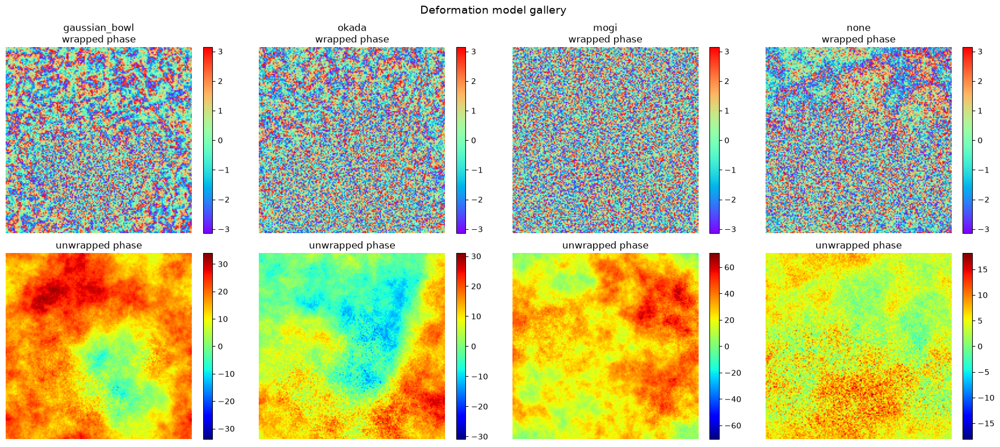

In [21]:

gallery_gen = InSARSyntheticGenerator(size=TRAIN_SCENE_SIZE, seed=SEED)
deformation_types = ["gaussian_bowl", "okada", "mogi", "none"]
gallery_samples = {}

deformation_kwargs = {
    "okada": dict(strike_deg=25.0, dip_deg=65.0, rake_deg=90.0, slip_m=0.5,
                  length_m=4000.0, width_m=2000.0, depth_m=5000.0),
    "mogi": dict(volume_change_m3=8e5, source_depth_m=2500.0),
    "gaussian_bowl": dict(amplitude_m=0.12, sigma_m=600.0),
}

for dtype in deformation_types:
    gallery_samples[dtype] = gallery_gen.generate_sample(
        deformation_type=dtype, deformation_kwargs=deformation_kwargs.get(dtype, {}),
    )

fig, axes = plt.subplots(2, 4, figsize=(18, 8))
for col, dtype in enumerate(deformation_types):
    s = gallery_samples[dtype]
    im0 = axes[0, col].imshow(s.wrapped_phase, cmap="rainbow", vmin=-math.pi, vmax=math.pi)
    axes[0, col].set_title(f"{dtype}\nwrapped phase")
    axes[0, col].axis("off")
    fig.colorbar(im0, ax=axes[0, col], fraction=0.046)

    vmax = max(abs(s.unwrapped_phase).max(), 1e-6)
    im1 = axes[1, col].imshow(s.unwrapped_phase, cmap="jet", vmin=-vmax, vmax=vmax)
    axes[1, col].set_title("unwrapped phase")
    axes[1, col].axis("off")
    fig.colorbar(im1, ax=axes[1, col], fraction=0.046)
fig.suptitle("Deformation model gallery", fontsize=14)
fig.tight_layout()
plt.show()


In [10]:

# Numeric summary of each deformation type.
rows = []
for dtype, s in gallery_samples.items():
    rows.append({
        "deformation_type": dtype,
        "unwrapped_min_rad": s.unwrapped_phase.min(),
        "unwrapped_max_rad": s.unwrapped_phase.max(),
        "unwrapped_std_rad": s.unwrapped_phase.std(),
        "max_abs_ambiguity_k": np.abs(s.ambiguity).max(),
        "mean_coherence": s.coherence.mean(),
    })
summary_df = pd.DataFrame(rows).set_index("deformation_type").round(3)
summary_df


,unwrapped_min_rad,unwrapped_max_rad,unwrapped_std_rad,max_abs_ambiguity_k,mean_coherence
deformation_type,,,,,
gaussian_bowl,-16.390,33.923,7.395,5.0,0.611
okada,-18.570,30.962,8.734,5.0,0.404
mogi,-6.810,70.573,11.590,11.0,0.349
none,-7.265,18.130,3.246,3.0,0.307



**A practical note on `k_max`:** `AmbiguityNet`'s primary head is bounded to
`[-k_max, k_max]` (default 10) via a scaled `tanh` -- see `ambiguity_net.py`.
The Okada parameters above were deliberately chosen (`depth_m=5000`,
`slip_m=0.5`) to keep `max_abs_ambiguity_k` comfortably under that bound. An
earlier, shallower/larger-slip parameterization we tried
(`depth_m=2500, slip_m=1.5, length_m=6000`) produced near-field ambiguity
values up to **k=173** -- far beyond what the architecture can ever
represent, which would make training loss numbers meaningless (dominated by
examples the model is structurally incapable of fitting, no matter how well
it learns). If you scale up deformation magnitude, fault proximity, or scene
resolution for your own training data, make sure `k_max` (and, more
fundamentally, your tile size relative to the deformation's spatial scale)
is chosen to match the ambiguity range your data actually produces.



### Physical component breakdown

Every sample is the sum of several independent physical contributions:
deformation, topography, atmosphere, orbital ramp, and decorrelation noise.
Let's decompose the Mogi sample to see each one individually.


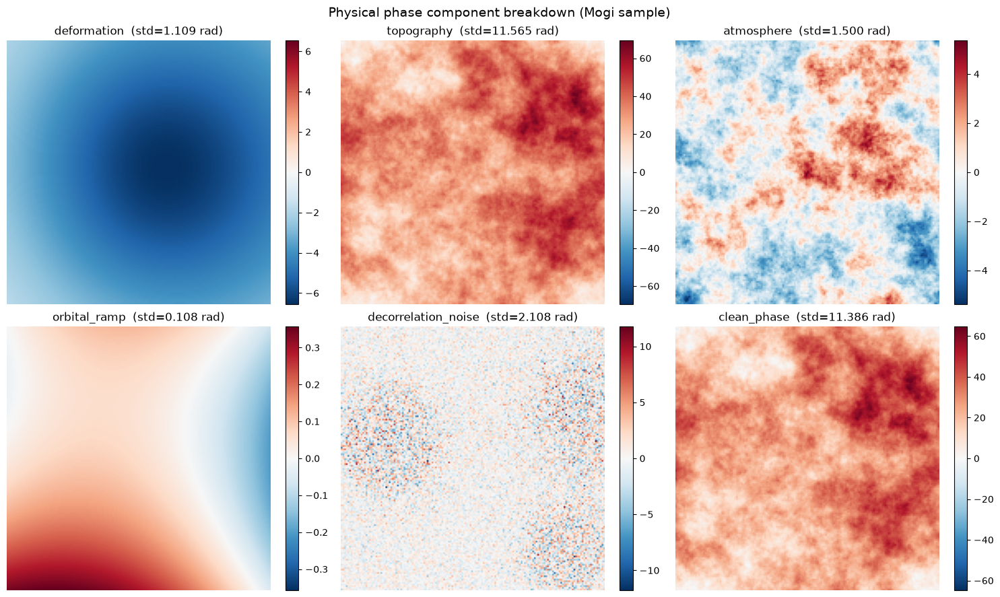

In [11]:

mogi_sample = gallery_samples["mogi"]
components = mogi_sample.components  # deformation, topography, atmosphere, orbital_ramp, decorrelation_noise, clean_phase

fig, axes = plt.subplots(2, 3, figsize=(15, 9))
comp_names = ["deformation", "topography", "atmosphere", "orbital_ramp", "decorrelation_noise", "clean_phase"]
for ax, name in zip(axes.ravel(), comp_names):
    arr = components[name]
    vmax = max(abs(arr).max(), 1e-6)
    im = ax.imshow(arr, cmap="RdBu_r", vmin=-vmax, vmax=vmax)
    ax.set_title(f"{name}  (std={arr.std():.3f} rad)")
    ax.axis("off")
    fig.colorbar(im, ax=ax, fraction=0.046)
fig.suptitle("Physical phase component breakdown (Mogi sample)", fontsize=14)
fig.tight_layout()
plt.show()


In [12]:

# Verify the hard physics constraint holds exactly for every deformation type.
print(f"{'deformation':<15s} {'max |wrap(unwrapped) - wrapped|':>32s}")
for dtype, s in gallery_samples.items():
    diff = np.abs(wrap_phase(s.unwrapped_phase) - s.wrapped_phase).max()
    print(f"{dtype:<15s} {diff:>32.2e}")


deformation      max |wrap(unwrapped) - wrapped|
gaussian_bowl                           0.00e+00
okada                                   0.00e+00
mogi                                    0.00e+00
none                                    0.00e+00



## 2. Preprocessing & tiling

Real interferograms are far too large to fit in GPU memory in one pass, so
`pyunwrap.data.preprocessing` cuts them into overlapping tiles. Let's
visualize the tile grid over one scene, and see what normalization does to
each channel's distribution.


Scene (160, 160) tiled into 9 tiles (tile_size=64, overlap=16).


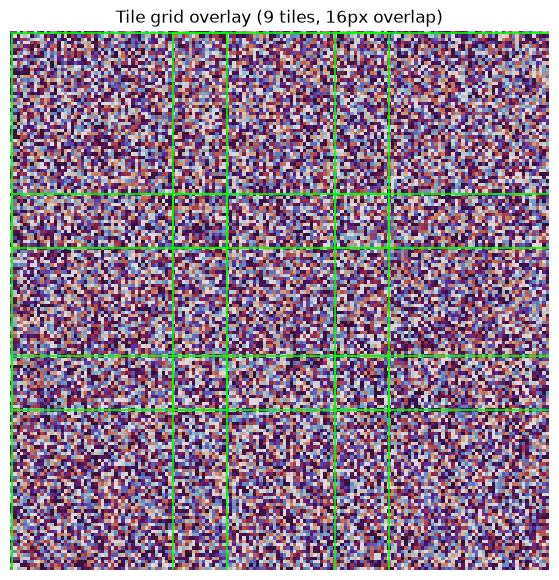

In [13]:

raster_shape = (TRAIN_SCENE_SIZE, TRAIN_SCENE_SIZE)
tile_specs = compute_tile_grid(raster_shape, tile_size=TILE_SIZE, overlap=OVERLAP)
print(f"Scene {raster_shape} tiled into {len(tile_specs)} tiles "
      f"(tile_size={TILE_SIZE}, overlap={OVERLAP}).")

fig, ax = plt.subplots(figsize=(7, 7))
ax.imshow(gallery_samples["mogi"].wrapped_phase, cmap="twilight", vmin=-math.pi, vmax=math.pi)
for spec in tile_specs:
    rect = patches.Rectangle(
        (spec.col, spec.row), spec.width, spec.height,
        linewidth=1.5, edgecolor="lime", facecolor="none", alpha=0.8,
    )
    ax.add_patch(rect)
ax.set_title(f"Tile grid overlay ({len(tile_specs)} tiles, {OVERLAP}px overlap)")
ax.axis("off")
plt.show()


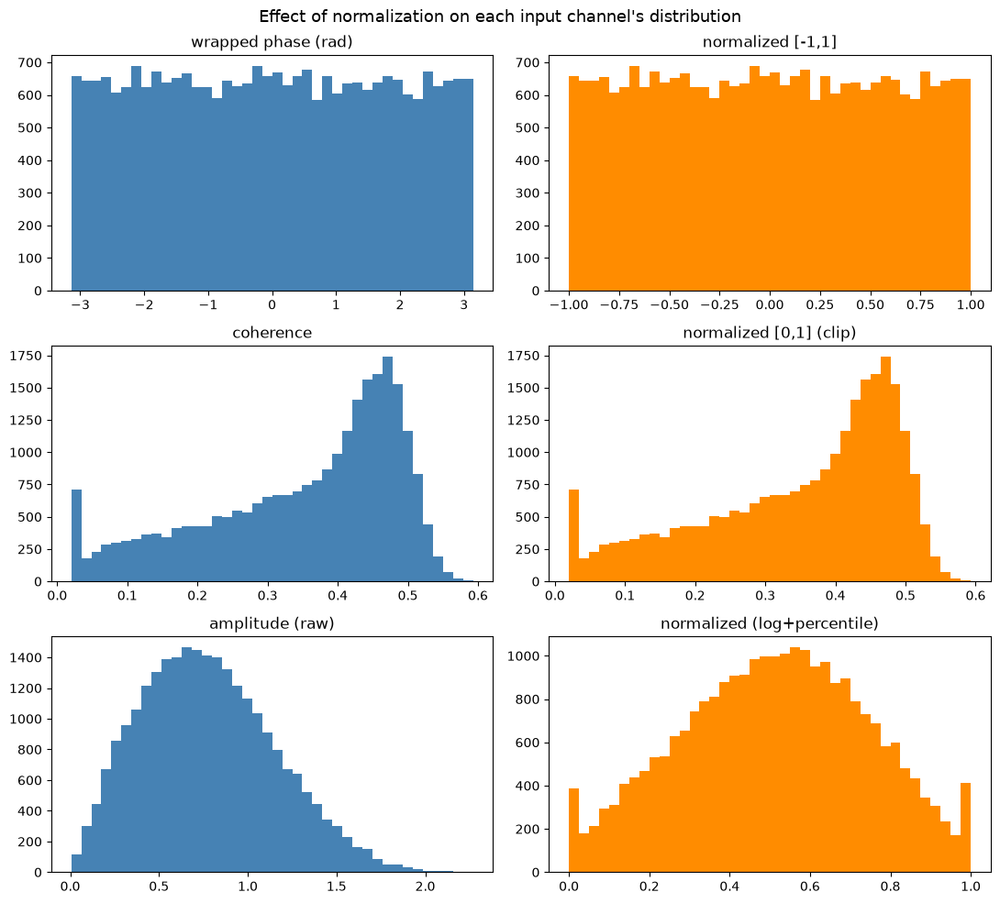

In [14]:

mogi_sample = gallery_samples["mogi"]
fig, axes = plt.subplots(3, 2, figsize=(11, 10))
raw_norm_pairs = [
    ("wrapped phase (rad)", mogi_sample.wrapped_phase, "normalized [-1,1]", normalize_phase(mogi_sample.wrapped_phase)),
    ("coherence", mogi_sample.coherence, "normalized [0,1] (clip)", normalize_coherence(mogi_sample.coherence)),
    ("amplitude (raw)", mogi_sample.amplitude, "normalized (log+percentile)", normalize_amplitude(mogi_sample.amplitude)),
]
for row, (raw_label, raw_arr, norm_label, norm_arr) in enumerate(raw_norm_pairs):
    axes[row, 0].hist(raw_arr.ravel(), bins=40, color="steelblue")
    axes[row, 0].set_title(raw_label)
    axes[row, 1].hist(norm_arr.ravel(), bins=40, color="darkorange")
    axes[row, 1].set_title(norm_label)
fig.suptitle("Effect of normalization on each input channel's distribution", fontsize=13)
fig.tight_layout()
plt.show()


## 3. Build the full training dataset

In [15]:

def build_tile_dataset(path, n_scenes, size, tile_size, overlap, seed):
    gen = InSARSyntheticGenerator(size=size, seed=seed)
    types_cycle = ["gaussian_bowl", "okada", "mogi", "none"]
    all_tiles = []
    for i in range(n_scenes):
        dtype = types_cycle[i % len(types_cycle)]
        sample = gen.generate_sample(deformation_type=dtype, deformation_kwargs=deformation_kwargs.get(dtype, {}))
        rasters = NormalizedRasters(
            wrapped_phase=normalize_phase(sample.wrapped_phase),
            coherence=normalize_coherence(sample.coherence),
            amplitude=normalize_amplitude(sample.amplitude),
        )
        tiles = list(iter_tiles(rasters, true_unwrapped=sample.unwrapped_phase, tile_size=tile_size, overlap=overlap))
        all_tiles.extend(tiles)
    save_tiles_hdf5(all_tiles, path)
    return len(all_tiles)

t0 = time.time()
n_train = build_tile_dataset(OUT_DIR / "train.h5", n_scenes=16, size=TRAIN_SCENE_SIZE,
                              tile_size=TILE_SIZE, overlap=OVERLAP, seed=SEED)
n_val = build_tile_dataset(OUT_DIR / "val.h5", n_scenes=4, size=TRAIN_SCENE_SIZE,
                            tile_size=TILE_SIZE, overlap=OVERLAP, seed=SEED + 1000)
print(f"train tiles: {n_train}, val tiles: {n_val}  (built in {time.time()-t0:.1f}s)")


train tiles: 144, val tiles: 36  (built in 0.7s)



## 4. Dataset, augmentation, and a physics-identity sweep

`InSARTileDataset` applies 8-fold dihedral augmentation (4 rotations x
flip), and *recomputes* the integer ambiguity map from the jointly
transformed wrapped/unwrapped pair each time -- let's see the augmentation
gallery for one tile, then verify the physics identity holds across the
entire dataset.


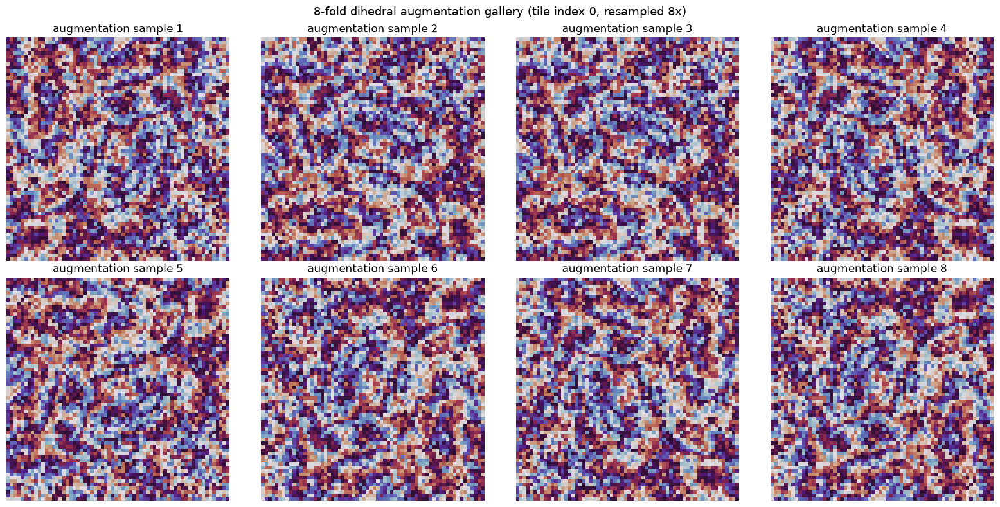

In [16]:

aug_ds = InSARTileDataset(OUT_DIR / "train.h5", augment=True, require_ground_truth=True, seed=SEED)

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for i, ax in enumerate(axes.ravel()):
    s = aug_ds[0]  # same underlying tile, re-sampled augmentation each call
    ax.imshow(s["wrapped_phase"].squeeze(0).numpy(), cmap="twilight", vmin=-1, vmax=1)
    ax.set_title(f"augmentation sample {i+1}")
    ax.axis("off")
fig.suptitle("8-fold dihedral augmentation gallery (tile index 0, resampled 8x)", fontsize=13)
fig.tight_layout()
plt.show()


In [17]:

from pyunwrap.data.preprocessing import denormalize_phase

train_ds = InSARTileDataset(OUT_DIR / "train.h5", augment=True, require_ground_truth=True, seed=SEED)
val_ds = InSARTileDataset(OUT_DIR / "val.h5", augment=False, require_ground_truth=True, seed=SEED)

max_diffs = []
for i in range(len(train_ds)):
    s = train_ds[i]
    wrapped_rad = denormalize_phase(s["wrapped_phase"].squeeze(0).numpy().astype(np.float64))
    unwrapped = s["true_unwrapped"].squeeze(0).numpy().astype(np.float64)
    k = s["true_ambiguity"].squeeze(0).numpy().astype(np.float64)
    recon = wrapped_rad + 2 * np.pi * k
    max_diffs.append(np.abs(recon - unwrapped).max())

print(f"Physics identity check across all {len(train_ds)} (augmented) training tiles:")
print(f"  max diff over dataset: {max(max_diffs):.2e}  (float32 storage precision, must be << 1)")
print(f"  mean diff over dataset: {np.mean(max_diffs):.2e}")

dl = build_dataloader(OUT_DIR / "train.h5", batch_size=4, augment=True, shuffle=True, num_workers=0, seed=1)
batch = next(iter(dl))
print("\nOne training batch:")
for k, v in batch.items():
    print(f"  {k:16s} {tuple(v.shape)}  {v.dtype}")


Physics identity check across all 144 (augmented) training tiles:
  max diff over dataset: 3.87e-06  (float32 storage precision, must be << 1)
  mean diff over dataset: 1.74e-06

One training batch:
  wrapped_phase    (4, 1, 64, 64)  torch.float32
  coherence        (4, 1, 64, 64)  torch.float32
  amplitude        (4, 1, 64, 64)  torch.float32
  true_unwrapped   (4, 1, 64, 64)  torch.float32
  true_ambiguity   (4, 1, 64, 64)  torch.float32


## 5. Model architecture

In [18]:

model = AmbiguityNet(pretrained=False, k_max=10.0)

def count_params(module):
    return sum(p.numel() for p in module.parameters())

breakdown = {
    "encoder (ResNet-34)": count_params(model.encoder),
    "decoder.dec4": count_params(model.dec4),
    "decoder.dec3": count_params(model.dec3),
    "decoder.dec2": count_params(model.dec2),
    "decoder.dec1": count_params(model.dec1),
    "decoder.dec0": count_params(model.dec0),
    "ambiguity_head": count_params(model.ambiguity_head),
    "residue_head": count_params(model.residue_head),
}
total = sum(breakdown.values())
param_df = pd.DataFrame(
    [(name, n, 100 * n / total) for name, n in breakdown.items()],
    columns=["submodule", "n_params", "pct_of_total"],
).set_index("submodule")
param_df["n_params"] = param_df["n_params"].map(lambda x: f"{x:,}")
param_df["pct_of_total"] = param_df["pct_of_total"].round(1)
print(f"Total parameters: {total:,}")
param_df


ImportError: torchvision is required for the ResNet-34 encoder.

In [12]:

model.eval()
x_demo = torch.rand(1, 3, 64, 64)
x_demo[:, 0] = x_demo[:, 0] * 2 - 1
with torch.no_grad():
    out_demo = model(x_demo)
print("Forward pass on a 64x64 dummy tile:")
print(f"  k_hat range:        [{out_demo.k_hat.min():.1f}, {out_demo.k_hat.max():.1f}]  (integer-valued: {torch.equal(out_demo.k_hat, torch.round(out_demo.k_hat))})")
print(f"  k_continuous range: [{out_demo.k_continuous.min():.3f}, {out_demo.k_continuous.max():.3f}]")
print(f"  residue_prob range: [{out_demo.residue_prob.min():.3f}, {out_demo.residue_prob.max():.3f}]")


Forward pass on a 64x64 dummy tile:
  k_hat range:        [2.0, 2.0]  (integer-valued: True)
  k_continuous range: [1.912, 1.980]
  residue_prob range: [0.544, 0.544]



## 6. Loss function walkthrough

`PhysicsInformedUnwrapLoss` combines four components. Let's demonstrate each
in isolation against controlled inputs, per the design documented in
`pyunwrap.models.losses`'s module docstring.


In [13]:

from pyunwrap.models.losses import wrap_phase_torch, discrete_laplacian

criterion = PhysicsInformedUnwrapLoss()
torch.manual_seed(0)

# --- Component 1: ambiguity loss, perfect vs. noisy prediction ---
k_true = torch.randint(-5, 6, (1, 1, 32, 32)).float()
k_perfect = k_true.clone()
k_noisy = k_true + torch.randn_like(k_true) * 1.5

loss_perfect = torch.nn.functional.mse_loss(k_perfect, k_true).item()
loss_noisy = torch.nn.functional.mse_loss(k_noisy, k_true).item()
print(f"Component 1 (ambiguity MSE): perfect prediction = {loss_perfect:.4f}, "
      f"noisy prediction = {loss_noisy:.4f}")

# --- Component 2: re-wrap consistency (architecturally near-zero by construction) ---
wrapped_norm = torch.rand(1, 1, 32, 32) * 2 - 1
wrapped_rad = wrapped_norm * math.pi
phi_hat = wrapped_rad + 2 * math.pi * torch.round(k_noisy)  # even a WRONG k_hat still satisfies this
psi_pred = wrap_phase_torch(phi_hat)
rewrap_loss = torch.nn.functional.mse_loss(psi_pred, wrapped_rad).item()
print(f"Component 2 (re-wrap consistency) with a WRONG k_hat: {rewrap_loss:.2e}  "
      f"(near-zero regardless of k correctness -- see module docstring)")

# --- Component 3: coherence-weighted smoothness ---
smooth_phi = torch.linspace(-5, 5, 32).view(1, 1, 1, 32).expand(1, 1, 32, 32)
rough_phi = smooth_phi + torch.randn_like(smooth_phi) * 3.0
coherence_high = torch.ones(1, 1, 32, 32) * 0.95
grad_x_smooth = smooth_phi[..., 1:] - smooth_phi[..., :-1]
grad_x_rough = rough_phi[..., 1:] - rough_phi[..., :-1]
smooth_loss = (coherence_high[..., 1:] * grad_x_smooth.pow(2)).mean().item()
rough_loss = (coherence_high[..., 1:] * grad_x_rough.pow(2)).mean().item()
print(f"Component 3 (coherence-weighted smoothness): smooth field = {smooth_loss:.3f}, "
      f"rough field = {rough_loss:.3f}")

# --- Component 4: ambiguity-map residue (Laplacian) penalty ---
k_smooth_field = torch.zeros(1, 1, 10, 10)
k_spiked_field = k_smooth_field.clone()
k_spiked_field[0, 0, 5, 5] = 3.0  # isolated, spatially-unsupported flip
residue_smooth = discrete_laplacian(k_smooth_field).pow(2).mean().item()
residue_spiked = discrete_laplacian(k_spiked_field).pow(2).mean().item()
print(f"Component 4 (ambiguity-map Laplacian residue): smooth k = {residue_smooth:.4f}, "
      f"isolated spike = {residue_spiked:.4f}")


Component 1 (ambiguity MSE): perfect prediction = 0.0000, noisy prediction = 2.2961
Component 2 (re-wrap consistency) with a WRONG k_hat: 1.05e-12  (near-zero regardless of k correctness -- see module docstring)
Component 3 (coherence-weighted smoothness): smooth field = 0.099, rough field = 16.205
Component 4 (ambiguity-map Laplacian residue): smooth k = 0.0000, isolated spike = 2.8125


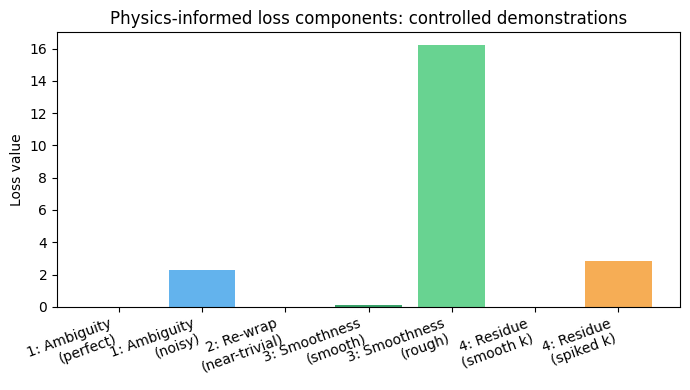

In [14]:

fig, ax = plt.subplots(figsize=(7, 4))
components_demo = {
    "1: Ambiguity\n(perfect)": loss_perfect, "1: Ambiguity\n(noisy)": loss_noisy,
    "2: Re-wrap\n(near-trivial)": rewrap_loss,
    "3: Smoothness\n(smooth)": smooth_loss, "3: Smoothness\n(rough)": rough_loss,
    "4: Residue\n(smooth k)": residue_smooth, "4: Residue\n(spiked k)": residue_spiked,
}
colors = ["#2b6cb0", "#63b3ed", "#a0aec0", "#38a169", "#68d391", "#dd6b20", "#f6ad55"]
ax.bar(components_demo.keys(), components_demo.values(), color=colors)
ax.set_ylabel("Loss value")
ax.set_title("Physics-informed loss components: controlled demonstrations")
plt.xticks(rotation=20, ha="right")
fig.tight_layout()
plt.show()



## 7. Training

A longer curriculum-learning run than the quick-demo notebook, with every
loss component and validation metric tracked.


In [ ]:

model = AmbiguityNet(pretrained=False, k_max=10.0)  # fresh model for the real training run

trainer = Trainer(
    model=model, 
    train_dataset=train_ds, 
    val_dataset=val_ds,
    out_dir=OUT_DIR / "training_run", 
    total_epochs=15, warmup_epochs=3,
    base_lr=1e-4, 
    batch_size=4, 
    num_workers=0, 
    grad_clip_norm=1.0,
    validate_every=3, 
    device="cpu", 
    use_curriculum=True,
)
t0 = time.time()
trainer.fit()
print(f"\nTraining completed in {time.time()-t0:.1f}s")


[CurriculumIndex] WARNING: epoch 1's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 1: curriculum subset size = 144 / 144


[Trainer] Epoch 1/15 loss=22.4953 lr=6.67e-05 (12.2s)
[CurriculumIndex] WARNING: epoch 2's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 2: curriculum subset size = 144 / 144


[Trainer] Epoch 2/15 loss=11.9967 lr=1.00e-04 (11.2s)
[CurriculumIndex] WARNING: epoch 3's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 3: curriculum subset size = 144 / 144


[Trainer] Epoch 3/15 loss=9.7419 lr=1.00e-04 (11.2s) | val_rmse=31.0233 rad val_pct<0.1rad=3.45% val_residues=1
[CurriculumIndex] WARNING: epoch 4's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 4: curriculum subset size = 144 / 144


[Trainer] Epoch 4/15 loss=9.1987 lr=9.83e-05 (11.3s)
[CurriculumIndex] WARNING: epoch 5's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 5: curriculum subset size = 144 / 144


[Trainer] Epoch 5/15 loss=9.0937 lr=9.33e-05 (11.3s)
[CurriculumIndex] WARNING: epoch 6's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 6: curriculum subset size = 144 / 144


[Trainer] Epoch 6/15 loss=9.0433 lr=8.54e-05 (11.2s) | val_rmse=30.4065 rad val_pct<0.1rad=9.28% val_residues=13
[CurriculumIndex] WARNING: epoch 7's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 7: curriculum subset size = 144 / 144


[Trainer] Epoch 7/15 loss=9.1621 lr=7.50e-05 (11.2s)
[CurriculumIndex] WARNING: epoch 8's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 8: curriculum subset size = 144 / 144


[Trainer] Epoch 8/15 loss=8.8387 lr=6.29e-05 (11.5s)
[CurriculumIndex] WARNING: epoch 9's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 9: curriculum subset size = 144 / 144


[Trainer] Epoch 9/15 loss=8.7440 lr=5.00e-05 (11.4s) | val_rmse=28.2779 rad val_pct<0.1rad=7.23% val_residues=0
[CurriculumIndex] WARNING: epoch 10's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 10: curriculum subset size = 144 / 144


[Trainer] Epoch 10/15 loss=8.7330 lr=3.71e-05 (11.3s)
[CurriculumIndex] WARNING: epoch 11's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 11: curriculum subset size = 144 / 144


[Trainer] Epoch 11/15 loss=8.0702 lr=2.50e-05 (11.1s)
[CurriculumIndex] WARNING: epoch 12's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 12: curriculum subset size = 144 / 144


[Trainer] Epoch 12/15 loss=8.2438 lr=1.46e-05 (11.2s) | val_rmse=28.6622 rad val_pct<0.1rad=10.64% val_residues=0
[CurriculumIndex] WARNING: epoch 13's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 13: curriculum subset size = 144 / 144


[Trainer] Epoch 13/15 loss=8.0979 lr=6.70e-06 (11.3s)
[CurriculumIndex] WARNING: epoch 14's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 14: curriculum subset size = 144 / 144


[Trainer] Epoch 14/15 loss=7.0749 lr=1.70e-06 (10.9s)
[CurriculumIndex] WARNING: epoch 15's curriculum filter matched 0 tiles; falling back to the full dataset for this epoch to avoid stalling training.
[Trainer] Epoch 15: curriculum subset size = 144 / 144


[Trainer] Epoch 15/15 loss=7.7247 lr=0.00e+00 (10.6s) | val_rmse=28.7941 rad val_pct<0.1rad=7.43% val_residues=0



Training completed in 176.9s


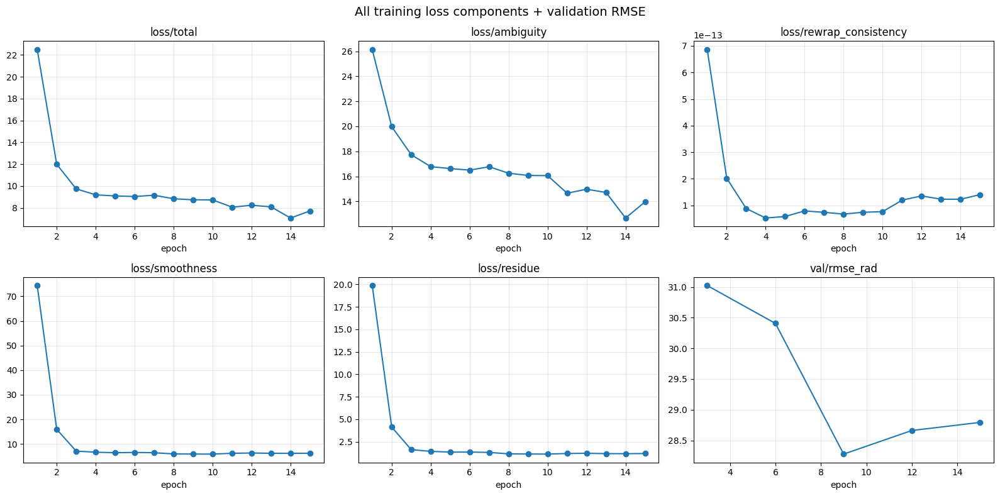

In [16]:

history = trainer.visualizer.history

fig, axes = plt.subplots(2, 3, figsize=(16, 8))
plot_keys = [
    "loss/total", "loss/ambiguity", "loss/rewrap_consistency",
    "loss/smoothness", "loss/residue", "val/rmse_rad",
]
for ax, key in zip(axes.ravel(), plot_keys):
    if key not in history:
        ax.set_visible(False)
        continue
    epochs, values = zip(*history[key])
    ax.plot(epochs, values, marker="o")
    ax.set_title(key)
    ax.set_xlabel("epoch")
    ax.grid(alpha=0.3)
fig.suptitle("All training loss components + validation RMSE", fontsize=14)
fig.tight_layout()
plt.show()


In [17]:

# Interactive Plotly version of the same curves.
metric_series = {k: tuple(zip(*v)) for k, v in history.items() if k.startswith("loss/") or k.startswith("val/")}
fig_curves = charts.plot_multi_metric_curves(metric_series, title="Training & validation metrics (interactive)")
fig_curves.show()


## 8. Validation metrics deep-dive

In [18]:

from torch.utils.data import DataLoader

val_loader = DataLoader(val_ds, batch_size=4, shuffle=False, num_workers=0)
final_val_metrics = evaluate(model, val_loader, device=torch.device("cpu"))

metrics_table = pd.DataFrame([{
    "RMSE (rad)": final_val_metrics.rmse_rad,
    "% pixels < 0.1 rad": final_val_metrics.pct_pixels_under_0p1_rad,
    "Residue count (proxy)": final_val_metrics.residue_count,
    "n_samples": final_val_metrics.n_samples,
}], index=["final validation"])
metrics_table.round(3)


,RMSE (rad),% pixels < 0.1 rad,Residue count (proxy),n_samples
final validation,28.794,7.429,0,36



## 9. Tiled inference on a full held-out scene

A larger (192x192) evaluation scene, written out as real GeoTIFFs, unwrapped
via `PhaseUnwrapper`'s tiled inference + smart merging with Monte Carlo
Dropout uncertainty estimation.


In [19]:

eval_gen = InSARSyntheticGenerator(size=EVAL_SCENE_SIZE, seed=SEED + 2000)
eval_sample = eval_gen.generate_sample(deformation_type="mogi", deformation_kwargs=dict(volume_change_m3=1e6, source_depth_m=3000.0))

transform = from_origin(500_000, 5_000_000, 20, 20)
profile = dict(driver="GTiff", height=EVAL_SCENE_SIZE, width=EVAL_SCENE_SIZE, count=1,
               dtype="float32", crs="EPSG:32633", transform=transform)
paths = {}
for name, arr in [("wrapped", eval_sample.wrapped_phase), ("coherence", eval_sample.coherence),
                   ("amplitude", eval_sample.amplitude)]:
    path = OUT_DIR / f"eval_{name}.tif"
    with rasterio.open(path, "w", **profile) as dst:
        dst.write(arr.astype(np.float32), 1)
    paths[name] = path

unwrapper = PhaseUnwrapper(model=model, device="cpu", mc_dropout_passes=5)
t0 = time.time()
result = unwrapper.unwrap(paths["wrapped"], paths["coherence"], paths["amplitude"],
                           tile_size=INFER_TILE_SIZE, overlap=INFER_OVERLAP)
print(f"Tiled inference over {EVAL_SCENE_SIZE}x{EVAL_SCENE_SIZE} scene "
      f"({len(compute_tile_grid((EVAL_SCENE_SIZE, EVAL_SCENE_SIZE), INFER_TILE_SIZE, INFER_OVERLAP))} tiles) "
      f"completed in {time.time()-t0:.1f}s")


Tiled inference over 192x192 scene (25 tiles) completed in 2.0s


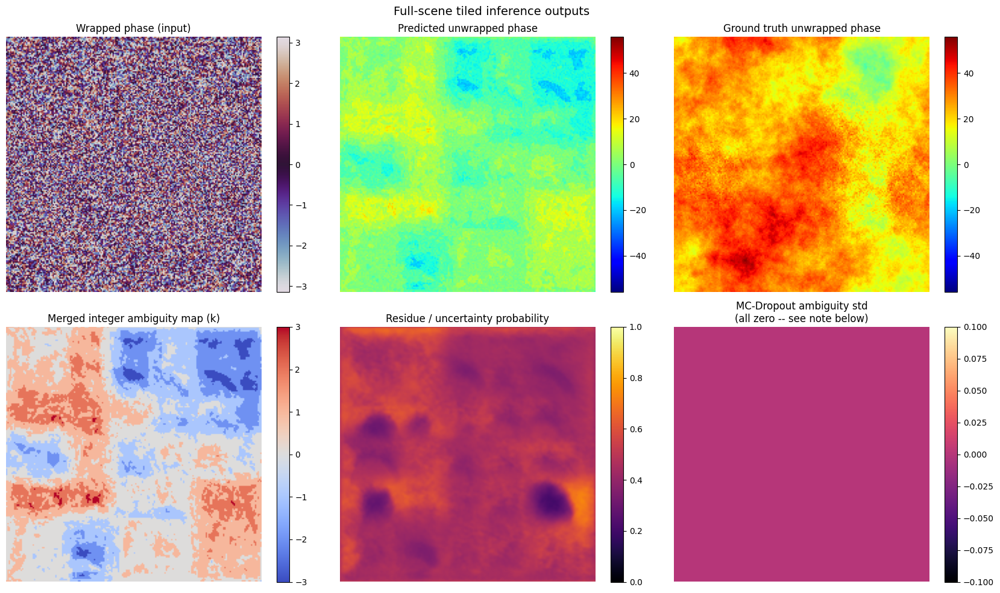

Note: AmbiguityNet has no explicit nn.Dropout layers yet (only BatchNorm), so Monte Carlo Dropout uncertainty is identically zero -- this is a known, documented gap (see PhaseUnwrapper._enable_mc_dropout's docstring), not a bug. residue_prob (the learned auxiliary head) is the meaningful uncertainty signal currently available.


In [20]:

fig, axes = plt.subplots(2, 3, figsize=(17, 10))

im0 = axes[0, 0].imshow(result.wrapped_phase, cmap="twilight", vmin=-math.pi, vmax=math.pi)
axes[0, 0].set_title("Wrapped phase (input)")
fig.colorbar(im0, ax=axes[0, 0], fraction=0.046)

vmax = max(abs(result.unwrapped_phase).max(), abs(eval_sample.unwrapped_phase).max())
im1 = axes[0, 1].imshow(result.unwrapped_phase, cmap="jet", vmin=-vmax, vmax=vmax)
axes[0, 1].set_title("Predicted unwrapped phase")
fig.colorbar(im1, ax=axes[0, 1], fraction=0.046)

im2 = axes[0, 2].imshow(eval_sample.unwrapped_phase, cmap="jet", vmin=-vmax, vmax=vmax)
axes[0, 2].set_title("Ground truth unwrapped phase")
fig.colorbar(im2, ax=axes[0, 2], fraction=0.046)

im3 = axes[1, 0].imshow(result.ambiguity_map, cmap="coolwarm")
axes[1, 0].set_title("Merged integer ambiguity map (k)")
fig.colorbar(im3, ax=axes[1, 0], fraction=0.046)

im4 = axes[1, 1].imshow(result.residue_prob, cmap="inferno", vmin=0, vmax=1)
axes[1, 1].set_title("Residue / uncertainty probability")
fig.colorbar(im4, ax=axes[1, 1], fraction=0.046)

im5 = axes[1, 2].imshow(result.uncertainty, cmap="magma")
axes[1, 2].set_title("MC-Dropout ambiguity std\n(all zero -- see note below)")
fig.colorbar(im5, ax=axes[1, 2], fraction=0.046)

for ax in axes.ravel():
    ax.axis("off")
fig.suptitle("Full-scene tiled inference outputs", fontsize=14)
fig.tight_layout()
plt.show()

print("Note: AmbiguityNet has no explicit nn.Dropout layers yet (only BatchNorm), so "
      "Monte Carlo Dropout uncertainty is identically zero -- this is a known, documented "
      "gap (see PhaseUnwrapper._enable_mc_dropout's docstring), not a bug. residue_prob "
      "(the learned auxiliary head) is the meaningful uncertainty signal currently available.")


### Physics identity verification

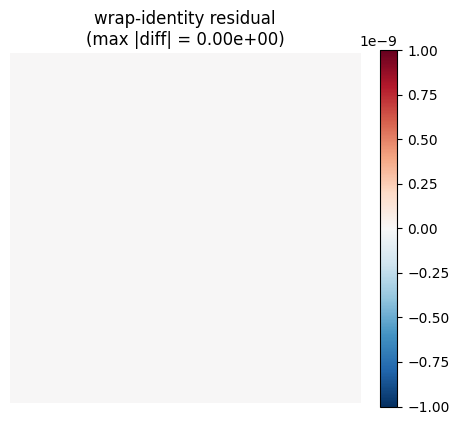

Hard physics constraint verified: unwrapped_phase == wrapped_phase + 2*pi*k exactly.


In [21]:

reconstructed = result.wrapped_phase + 2 * math.pi * result.ambiguity_map
diff = reconstructed - result.unwrapped_phase

fig, ax = plt.subplots(figsize=(5, 5))
im = ax.imshow(diff, cmap="RdBu_r", vmin=-1e-9, vmax=1e-9)
ax.set_title(f"wrap-identity residual\n(max |diff| = {np.abs(diff).max():.2e})")
ax.axis("off")
fig.colorbar(im, ax=ax, fraction=0.046)
plt.show()

assert np.abs(diff).max() < 1e-9, "hard physics constraint violated!"
print("Hard physics constraint verified: unwrapped_phase == wrapped_phase + 2*pi*k exactly.")



## 10. Phase analytics: residues, Nyquist gradient, error distribution


In [22]:

residue_map, clusters_df = phase_stats.detect_residues(result.unwrapped_phase)
print(f"Detected {len(clusters_df)} residue clusters "
      f"({(clusters_df['charge_sign']==1).sum()} positive, {(clusters_df['charge_sign']==-1).sum()} negative).")
clusters_df.head(10)


Detected 6703 residue clusters (3388 positive, 3315 negative).


,charge_sign,n_pixels,centroid_row,centroid_col
0,1,2,0.500000,6.5
1,1,1,0.000000,19.0
2,1,3,0.333333,34.0
3,1,3,0.333333,40.0
4,1,1,0.000000,53.0
5,1,1,0.000000,88.0
6,1,1,0.000000,92.0
7,1,1,0.000000,98.0
8,1,1,0.000000,100.0
9,1,1,0.000000,106.0


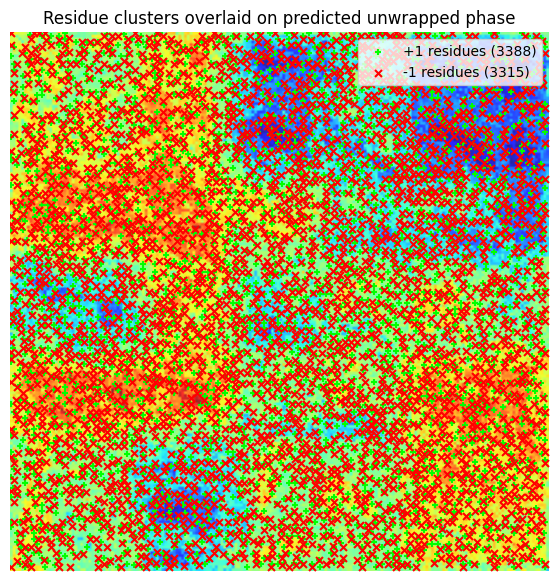

In [23]:

fig, ax = plt.subplots(figsize=(7, 7))
ax.imshow(result.unwrapped_phase, cmap="jet", alpha=0.85)
pos = clusters_df[clusters_df["charge_sign"] == 1]
neg = clusters_df[clusters_df["charge_sign"] == -1]
ax.scatter(pos["centroid_col"], pos["centroid_row"], marker="+", s=25, c="lime", label=f"+1 residues ({len(pos)})")
ax.scatter(neg["centroid_col"], neg["centroid_row"], marker="x", s=25, c="red", label=f"-1 residues ({len(neg)})")
ax.legend(loc="upper right")
ax.set_title("Residue clusters overlaid on predicted unwrapped phase")
ax.axis("off")
plt.show()


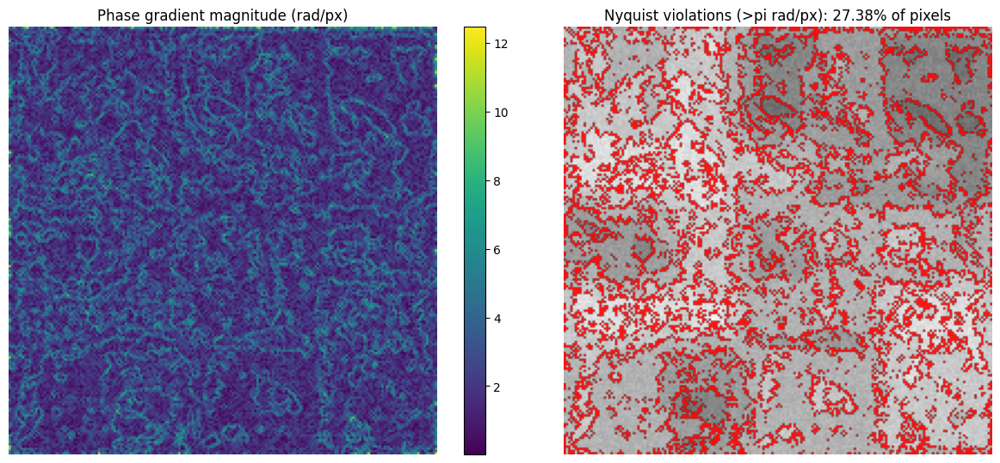

,value
mean_gradient,2.4649
p95_gradient,5.3592
max_gradient,12.4671
n_nyquist_violations,10092.0000
pct_nyquist_violations,27.3763


In [24]:

grad_mag = phase_stats.phase_gradient_magnitude(result.unwrapped_phase)
violations = phase_stats.nyquist_violation_map(result.unwrapped_phase)
grad_summary = phase_stats.gradient_analysis_summary(result.unwrapped_phase)

fig, axes = plt.subplots(1, 2, figsize=(13, 5.5))
im0 = axes[0].imshow(grad_mag, cmap="viridis")
axes[0].set_title("Phase gradient magnitude (rad/px)")
axes[0].axis("off")
fig.colorbar(im0, ax=axes[0], fraction=0.046)

axes[1].imshow(result.unwrapped_phase, cmap="gray", alpha=0.6)
axes[1].imshow(np.ma.masked_where(~violations, violations), cmap="autumn", alpha=0.9)
axes[1].set_title(f"Nyquist violations (>pi rad/px): {grad_summary['pct_nyquist_violations']:.2f}% of pixels")
axes[1].axis("off")
fig.tight_layout()
plt.show()

pd.DataFrame([grad_summary]).T.rename(columns={0: "value"}).round(4)


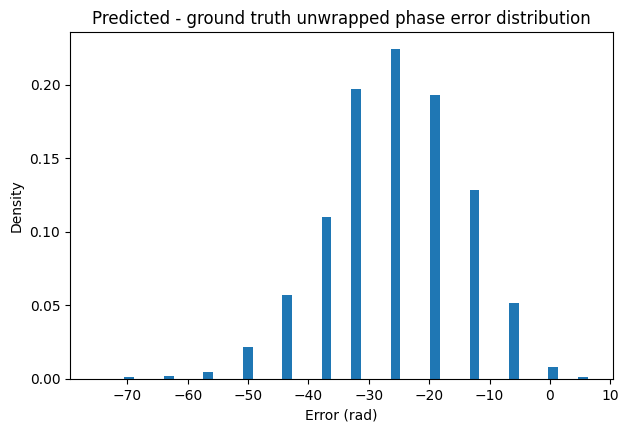

,value
mean_error,-25.6071
std_error,10.9715
rmse,27.8585
mae,25.6197
p50_abs_error,25.1327
p95_abs_error,43.9823
max_abs_error,75.3982
pct_under_0p1_rad,0.7894
pct_under_0p5_rad,0.7894


In [25]:

hist_df, error_summary = phase_stats.compute_error_distribution(result.unwrapped_phase, eval_sample.unwrapped_phase)

fig, ax = plt.subplots(figsize=(7, 4.5))
ax.bar(hist_df["bin_center"], hist_df["density"], width=(hist_df["bin_center"].iloc[1] - hist_df["bin_center"].iloc[0]))
ax.set_xlabel("Error (rad)")
ax.set_ylabel("Density")
ax.set_title("Predicted - ground truth unwrapped phase error distribution")
plt.show()

pd.DataFrame([error_summary]).T.rename(columns={0: "value"}).round(4)


In [26]:

fig_hist = charts.plot_error_histogram(hist_df, title="Phase error distribution (interactive)")
fig_hist.show()



## 11. Explainability: Grad-CAM, Integrated Gradients, uncertainty calibration


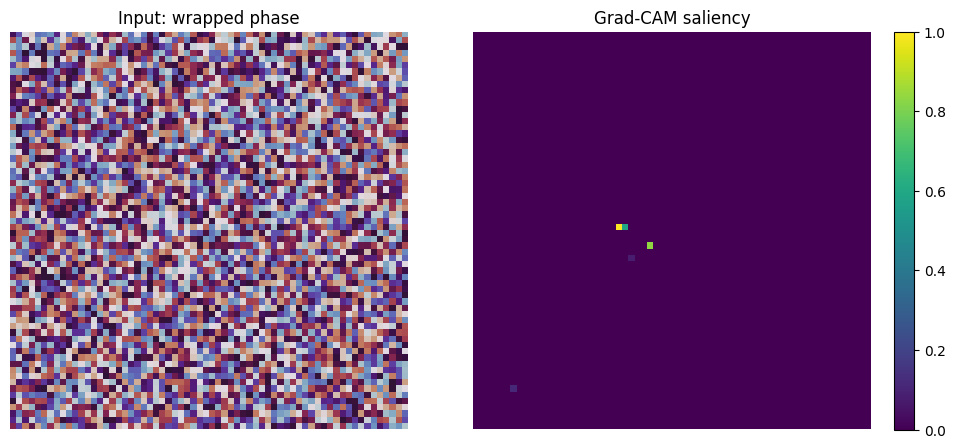

Integrated Gradients per-channel attribution share:
  wrapped_phase    38.9%  ###################
  coherence        21.8%  ##########
  amplitude        39.3%  ###################


In [27]:

sample_tile = val_ds[0]
x_explain = torch.cat([sample_tile["wrapped_phase"], sample_tile["coherence"], sample_tile["amplitude"]], dim=0).unsqueeze(0)

cam_result = explainability.grad_cam(model, x_explain)
ig_result = explainability.integrated_gradients(model, x_explain, steps=50)

fig, axes = plt.subplots(1, 2, figsize=(10, 4.5))
axes[0].imshow(x_explain[0, 0].numpy(), cmap="twilight")
axes[0].set_title("Input: wrapped phase")
axes[0].axis("off")
im1 = axes[1].imshow(cam_result.saliency_map, cmap="viridis")
axes[1].set_title("Grad-CAM saliency")
axes[1].axis("off")
fig.colorbar(im1, ax=axes[1], fraction=0.046)
fig.tight_layout()
plt.show()

channel_names = list(ig_result.channel_importance.keys())
print("Integrated Gradients per-channel attribution share:")
for name, share in ig_result.channel_importance.items():
    bar = "#" * int(share * 50)
    print(f"  {name:15s} {share*100:5.1f}%  {bar}")


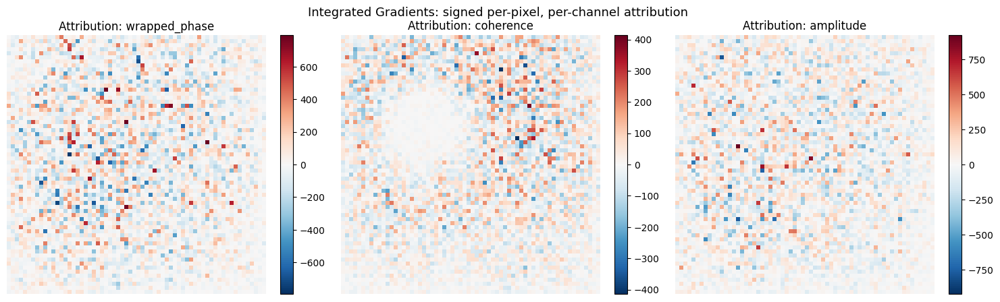

In [28]:

# Full per-channel attribution maps (signed), one heatmap per input channel.
fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))
for ax, name, attr in zip(axes, channel_names, ig_result.attribution_map):
    vmax = max(np.abs(attr).max(), 1e-8)
    im = ax.imshow(attr, cmap="RdBu_r", vmin=-vmax, vmax=vmax)
    ax.set_title(f"Attribution: {name}")
    ax.axis("off")
    fig.colorbar(im, ax=ax, fraction=0.046)
fig.suptitle("Integrated Gradients: signed per-pixel, per-channel attribution", fontsize=13)
fig.tight_layout()
plt.show()


In [29]:

# Uncertainty calibration. AmbiguityNet has no Dropout layers yet (MC-Dropout
# std is identically zero -- see the note in section 9), so we use the
# learned residue-probability head as the uncertainty signal instead, which
# IS meaningful and varies spatially.
error_map_val = np.abs(result.unwrapped_phase - eval_sample.unwrapped_phase)
bins_df, calib_summary = explainability.reliability_diagram(
    result.residue_prob, error_map_val, n_bins=10,
)
print("Calibration summary (residue_prob vs. actual |error|):", calib_summary)
bins_df.round(4)


Calibration summary (residue_prob vs. actual |error|): {'spearman_correlation': -0.20666429340858852, 'n_bins_used': 10}


,bin_center,mean_predicted_uncertainty,mean_actual_error,n_pixels
0,0.2315,0.2308,7.1296,193
1,0.2841,0.2904,14.0689,322
2,0.3367,0.3440,25.1327,847
3,0.3893,0.3974,28.1596,4135
4,0.4420,0.4435,28.9439,15034
5,0.4946,0.4916,23.2849,9776
6,0.5472,0.5440,20.7893,4483
7,0.5998,0.5934,21.2644,1405
8,0.6525,0.6462,24.6128,435
9,0.7051,0.7001,18.1783,234


In [30]:

fig_reliability = charts.plot_reliability_diagram(bins_df, title="Uncertainty calibration: residue_prob vs. actual error")
fig_reliability.show()


## 12. 3D & interactive visualization

In [31]:

fig3d_pred = phase_plots.plot_phase_surface_3d(result.unwrapped_phase, title="Predicted unwrapped phase (3D)")
fig3d_pred.show()


In [32]:

fig3d_compare = phase_plots.plot_phase_surface_comparison_3d(result.unwrapped_phase, eval_sample.unwrapped_phase)
fig3d_compare.show()


In [33]:

fig_residue_heatmap = phase_plots.plot_residue_probability_heatmap(result.residue_prob)
fig_residue_heatmap.show()



### Interactive map (folium)

A swipe-comparison map between wrapped and unwrapped phase, georeferenced
from the scene's UTM CRS to WGS84, with coherence and residue-probability as
togglable overlay layers.


In [34]:

fmap = maps_module.build_phase_comparison_map(
    wrapped_phase=result.wrapped_phase,
    unwrapped_phase=result.unwrapped_phase,
    geotiff_profile=result.geotiff_profile,
    coherence=eval_sample.coherence,
    residue_prob=result.residue_prob,
)
map_path = maps_module.save_map(fmap, OUT_DIR / "phase_map_standalone.html")
print(f"Interactive map saved to: {map_path.resolve()}")
display(IFrame(src=str(map_path), width="100%", height=500))


Interactive map saved to: /home/claude/pyunwrap/notebooks/nb_full_pipeline/phase_map_standalone.html



## 13. Deployment: ONNX export and PyTorch-vs-ONNX comparison


In [35]:

onnx_path = export_to_onnx(model, OUT_DIR / "ambiguity_net.onnx", input_shape=(1, 3, 64, 64), fp16=False)
print(f"Exported ONNX model: {onnx_path}  ({onnx_path.stat().st_size / 1e6:.1f} MB)")

engine = InferenceEngine(onnx_path, prefer_gpu=True)
print(f"ONNX Runtime backend selected: {engine.backend}")

onnx_unwrapper = PhaseUnwrapper(onnx_path=onnx_path)
onnx_result = onnx_unwrapper.unwrap(paths["wrapped"], paths["coherence"], paths["amplitude"],
                                     tile_size=INFER_TILE_SIZE, overlap=INFER_OVERLAP)

max_k_diff = np.abs(onnx_result.ambiguity_map - result.ambiguity_map).max()
max_phase_diff = np.abs(onnx_result.unwrapped_phase - result.unwrapped_phase).max()
print(f"\nPyTorch vs. ONNX backend agreement on the full evaluation scene:")
print(f"  max |ambiguity_map diff|  = {max_k_diff:.2e}")
print(f"  max |unwrapped_phase diff| = {max_phase_diff:.2e}")


/home/claude/pyunwrap/pyunwrap/utils/deployment.py:115: UserWarning: # 'dynamic_axes' is not recommended when dynamo=True, and may lead to 'torch._dynamo.exc.UserError: Constraints violated.' Supply the 'dynamic_shapes' argument instead if export is unsuccessful.
  torch.onnx.export(


[torch.onnx] Obtain model graph for `_ONNXWrapper([...]` with `torch.export.export(..., strict=False)`...


[torch.onnx] Obtain model graph for `_ONNXWrapper([...]` with `torch.export.export(..., strict=False)`... ✅
[torch.onnx] Run decompositions...


/usr/lib/python3.12/copyreg.py:99: FutureWarning: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
  return cls.__new__(cls, *args)


[torch.onnx] Run decompositions... ✅
[torch.onnx] Translate the graph into ONNX...
[torch.onnx] Translate the graph into ONNX... ✅
[torch.onnx] Optimize the ONNX graph...


[torch.onnx] Optimize the ONNX graph... ✅


Exported ONNX model: nb_full_pipeline/ambiguity_net.onnx  (98.0 MB)
ONNX Runtime backend selected: onnxruntime-cpu


[PhaseUnwrapper] ONNX backend initialized: onnxruntime-cpu



PyTorch vs. ONNX backend agreement on the full evaluation scene:
  max |ambiguity_map diff|  = 0.00e+00
  max |unwrapped_phase diff| = 0.00e+00


## 14. Automated HTML report

In [36]:

report_path = generate_report(
    result, out_dir=OUT_DIR / "report", true_unwrapped=eval_sample.unwrapped_phase,
    model=model, sample_tile_input=x_explain, training_history=trainer.visualizer.history,
)
print(f"Report written to: {report_path.resolve()}")
display(IFrame(src=str(report_path), width="100%", height=700))


Report written to: /home/claude/pyunwrap/notebooks/nb_full_pipeline/report/report.html


## 15. Summary

In [37]:

summary = {
    "Training epochs": 15,
    "Training tiles": n_train,
    "Validation tiles": n_val,
    "Final train loss (total)": history["loss/total"][-1][1],
    "Final val RMSE (rad)": final_val_metrics.rmse_rad,
    "Eval scene size": f"{EVAL_SCENE_SIZE}x{EVAL_SCENE_SIZE}",
    "Physics identity max error": float(np.abs(diff).max()),
    "Residue clusters detected": len(clusters_df),
    "Nyquist violations (%)": grad_summary["pct_nyquist_violations"],
    "Error RMSE vs ground truth (rad)": error_summary["rmse"],
    "% pixels error < 0.1 rad": error_summary["pct_under_0p1_rad"],
    "Uncertainty calibration (Spearman rho)": calib_summary["spearman_correlation"],
    "PyTorch vs ONNX max ambiguity diff": max_k_diff,
    "PyTorch vs ONNX max phase diff": max_phase_diff,
}
pd.DataFrame([summary]).T.rename(columns={0: "value"})


,value
Training epochs,15
Training tiles,144
Validation tiles,36
Final train loss (total),7.724671
Final val RMSE (rad),28.794051
Eval scene size,192x192
Physics identity max error,0.0
Residue clusters detected,6703
Nyquist violations (%),27.376302
Error RMSE vs ground truth (rad),27.858522



## Recap

This notebook exercised, against real synthetic data and real file I/O:

`InSARSyntheticGenerator` (all 4 deformation models + component breakdown)
&rarr; `preprocessing` (normalization + tiling, visualized) &rarr;
`InSARTileDataset` (augmentation gallery + dataset-wide physics-identity
sweep) &rarr; `AmbiguityNet` (parameter breakdown) &rarr;
`PhysicsInformedUnwrapLoss` (all 4 components demonstrated individually)
&rarr; `Trainer.fit()` (15-epoch curriculum run, every metric plotted)
&rarr; `PhaseUnwrapper.unwrap()` (full-scene tiled inference, every output
channel visualized, physics identity re-verified) &rarr; `phase_stats`
(residues overlaid, Nyquist violations mapped, error distribution) &rarr;
`explainability` (Grad-CAM, full per-channel attribution maps, uncertainty
calibration) &rarr; `phase_plots`/`maps` (3D surfaces + interactive swipe
map) &rarr; `deployment` (ONNX export + numerical PyTorch/ONNX agreement)
&rarr; `report_generator` (the full HTML report).

For production use: train the full 60-epoch / 3-stage curriculum schedule
(see `Trainer`'s docstring) on a much larger and more diverse synthetic
dataset, optionally followed by SNAPHU pseudo-ground-truth fine-tuning on
real Sentinel-1 data, before deploying via the ONNX/OpenVINO path shown
above.
